# Wine Quality Analyis 
### INTRODUCTION 
Wine is an alcoholic drink that is made from fermented grapes. It was previously viewed as a pricey, luxury item but it has now become a increasingly popular to a wider range of consumers. The wine quality dataset contains results from physicochemical tests and outputs from sensory variables that allow us to model wine quality. The data was collected from May 2004 to February 2007 where samples were tested by a certified entity (*CVRVV – an inter-professional organization with the goal of improving the quality and marketing of vinho verde*) and the resulting data recorded in a computerized system which automatically manages the wine sample testing process.

There are two separate data sets for vinho verde’s red and white variants from the Minho region of Portugal. This data can be used in the study of wine to understand which wines could possibly be improved on or perhaps changed altogether. It can also be used in a business setting like target marketing where the data may be used to discern consumer preferences in order to build a custom marketing plan. 

### THE DATA
For a more effective analysis I thought it would be best to combine these two datasets into one long dataframe with a new column called **wine_type**. The resulting dataframe is stores in the **project_functions.py** in the **scripts** directory which I will be able to call when it will be needed in the analysis. This dataframe will have the following variables:
1. **wine_type:** this is the new column created in the data wrangling process and has to unique variables - red wine and white wine.
2. **citric acid:** it can be found in small quantities and can add a fresh flavour to the wines. It is measured in *g/dm<sup>3</sup>*.
3. **fixed acidity:** these acids also known as nonvolatile acids do not evaporate readily. They include tartaric, malic, citric, and succinic acids and in this dataset this variable is expressed as *g(tartaric acid)/dm<sup>3</sup>*.
4. **volatile acidity:** this is the amount of acetic acid in the wines, which at too high of levels can lead to an unpleasant, vinegar taste and therefore must be distilled out of the wine during the production process. It is measured in *g(acetic acid)/dm<sup>3</sup>*.
5. **residual sugar:** this is the amount of natural sugar from the grapes that remains after fermentation stops, and is measured in *g/dm<sup>3</sup>* in this dataset.
6. **chlorides:** these are the amount of salts found in the wines and it is measured in *g(sodium chloride)/dm<sup>3</sup>*.
7. **sulphates:** these are wine additives which can contribute to sulfur dioxide gas (S0<sub>2</sub>) levels, which in turn acts as an antimicrobial and antioxidant. It is measured in *g(potassium sulphate)/dm<sup>3</sup>* in this dataset.
8. **free sulfur dioxide:** this is the free form of S0<sub>2</sub> exists in equilibrium between molecular S0<sub>2</sub> (as a dissolved gas) and bisulfite ion; it prevents microbial growth and the oxidation of wine. It is measures in *mg/dm<sup>3</sup>*.
9. **total sulfur dioxide:** this is amount of free and bound forms of S0<sub>2</sub>; in low concentrations. S0<sub>2</sub> is mostly undetectable in wine, but at free S0<sub>2</sub> concentrations over 50 ppm, S0<sub>2</sub> becomes evident in the nose and taste of wine. It is measured in *mg/dm<sup>3</sup>*.
10. **density:** this is comparison of the weight of a specific volume of wine to an equivalent volume of water and can begenerally used as a measure of the conversion of sugar to alcohol. It is measured in *g/dm<sup>3</sup>*.
11. **pH:** this describes how acidic or basic a wine is on a scale from 0 (very acidic) to 14 (very basic); most wines are between 3-4 on the pH scale because they are mostly acidic. 
12. **alcohol:** this is the percentage contained in the wines and is usually measured in *vol.%*
13. **quality:** the wine was graded by experts and assigned a value from 0(very bad) to 10(excellent)
14. **quality_label:** this is a new column created during the data wrangling process where values less than or equal to 5 were labeled low quality, quality values 6 and 7 as medium quality and values more than or equal to 8 as high quality.

### RESEARCH QUESTIONS 
Based on the information seen above I thought it would be interesting to use analysis to answer the following three research questions.
- **Research question 1:** Do the best wines have a high alcohol content or a high fixed acidity, or both?
    - `Initial thoughts`
        - First it would be wise to look at the correlation between alcohol and fixed acidity because it will give us a rough idea if it would affect quality in the same way.
        - We can then look at the relationship between alcohol and quality, and fixed acidity and quality on an individual level.
        - If results show both have an effect on quality we can combine them and then compare them with quality.
- **Research question 2:** Does the amount of residual sugar in white wines lead to a higher density for those wines? 
    - `Initial thoughts`
        - We can wrangle the data further by dropping any columns that aren't needed and using .loc to remove red wine data.
        - We can then find the correlation between the two variables by plotting a graph.
- **Research question 3:** Does acidity based on the fixed acidity and pH have an effect on the quality of the wine samples?
    - `Initial thoughts`
        - First it would be wise to look at the correlation between the fixed acidity and pH of red wine samples.
        - We can then wrangle the data further by dropping any columns that aren't needed in order to make it useful for our analysis.
        - Finally we can look at quality based on both these attributes.

---

## EXPLORATORY DATA ANALYSIS (EDA)
Let us load our dataframe by calling it from the **project_functions.py** using relative import, and call it **df**.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys, os

In [3]:
#Using relative import to load the dataframe from the project_functions.py
sys.path.insert(0, os.path.abspath('..'))
from scripts.project_functions import load_and_process
df = load_and_process("../data/raw/winequality-red.csv","../data/raw/winequality-white.csv")

The first step would be to take a look at the data by printing out the first five rows of the dataframe.

In [4]:
# Taking a look at the first five rows of the dataframe
df.head()

,wine_type,citric acid,fixed acidity,volatile acidity,residual sugar,chlorides,sulphates,free sulfur dioxide,total sulfur dioxide,density,pH,alcohol,quality,quality_label
0,red wine,0.22,6.8,0.56,1.8,0.074,0.82,15.0,24.0,0.99438,3.40,11.2,6,medium quality
1,white wine,0.36,6.4,0.30,2.0,0.052,0.53,18.0,141.0,0.99273,3.38,10.5,6,medium quality
2,white wine,0.29,5.9,0.17,3.1,0.030,0.33,32.0,123.0,0.98913,3.41,13.7,7,medium quality
3,white wine,0.24,7.0,0.24,1.8,0.047,0.43,29.0,91.0,0.99251,3.30,9.9,6,medium quality
4,white wine,0.07,6.4,0.45,1.1,0.030,0.28,10.0,131.0,0.99050,2.97,10.8,5,low quality


We should find out how many rows there are in this dataframe. We can do that by using `df.shape` 

In [5]:
# checking rows and columns using .shape
df.shape


(5320, 14)

    There are 14 variables in this dataframe and data has been collected on 5320 wine samples.

Let take a look at these 14 variables. Are they the the same as the data we described above?

In [6]:
#What columns are there in this dataframe 
df.columns

Index(['wine_type', 'citric acid', 'fixed acidity', 'volatile acidity',
       'residual sugar', 'chlorides', 'sulphates', 'free sulfur dioxide',
       'total sulfur dioxide', 'density', 'pH', 'alcohol', 'quality',
       'quality_label'],
      dtype='object')

    We can see that each of these variables correspond to the variables described above.

Now, since there are two types of wines in this data: red wines and white wines, lets find out how the number of occurences of both the data types by plotting the data using `sns.countplot()`

Text(0.5, 0, 'Wine Type')

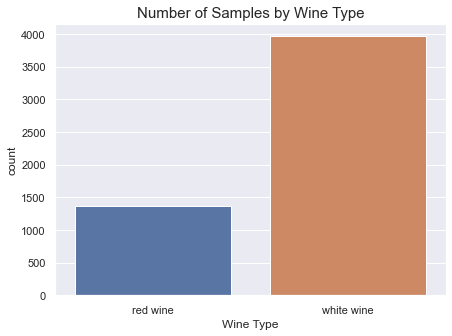

In [7]:
# Finding out the distribution of the data by the wine type
sns.set(rc={'figure.figsize':(7,5)})
sns.countplot(x='wine_type',data = df)
plt.title("Number of Samples by Wine Type", fontsize=15)
plt.xlabel("Wine Type")

    From the countplot above we can see that there is more than twice the amount of white wine data than red wine data.
We can use `df.info()` to find summarry information about this dataframe. 

In [8]:
# using .info() to get summary information about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5320 entries, 0 to 6496
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   wine_type             5320 non-null   object 
 1   citric acid           5320 non-null   float64
 2   fixed acidity         5320 non-null   float64
 3   volatile acidity      5320 non-null   float64
 4   residual sugar        5320 non-null   float64
 5   chlorides             5320 non-null   float64
 6   sulphates             5320 non-null   float64
 7   free sulfur dioxide   5320 non-null   float64
 8   total sulfur dioxide  5320 non-null   float64
 9   density               5320 non-null   float64
 10  pH                    5320 non-null   float64
 11  alcohol               5320 non-null   float64
 12  quality               5320 non-null   int64  
 13  quality_label         5320 non-null   object 
dtypes: float64(11), int64(1), object(2)
memory usage: 783.4+ KB


    The dataframe has 12 numerical variables, 11 of which are floats and quality having an integer data type. wine_type and quality_label have an object data type. We can also infer that there is no null values in this data since all columns have 5320 entries and there are 5320 rows in the dataframe.
But lets us confirm this with `isna().sum()`.

In [9]:
#Check for null values in the dataset
df.isna().sum()

wine_type               0
citric acid             0
fixed acidity           0
volatile acidity        0
residual sugar          0
chlorides               0
sulphates               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
alcohol                 0
quality                 0
quality_label           0
dtype: int64

    This shows that there are no null values and so the dropna() function will not be needed.

Another thing that we can do is look at general summary statistics using `df.describe()`

In [10]:
# summary statistics for numerical variables in the dataframe
df.describe(include =[np.number]).T

,count,mean,std,min,25%,50%,75%,max
citric acid,5320.0,0.318494,0.147157,0.00000,0.2400,0.31000,0.40000,1.66000
fixed acidity,5320.0,7.215179,1.319671,3.80000,6.4000,7.00000,7.70000,15.90000
volatile acidity,5320.0,0.344130,0.168248,0.08000,0.2300,0.30000,0.41000,1.58000
residual sugar,5320.0,5.048477,4.500180,0.60000,1.8000,2.70000,7.50000,65.80000
chlorides,5320.0,0.056690,0.036863,0.00900,0.0380,0.04700,0.06600,0.61100
sulphates,5320.0,0.533357,0.149743,0.22000,0.4300,0.51000,0.60000,2.00000
free sulfur dioxide,5320.0,30.036654,17.805045,1.00000,16.0000,28.00000,41.00000,289.00000
total sulfur dioxide,5320.0,114.109023,56.774223,6.00000,74.0000,116.00000,153.25000,440.00000
density,5320.0,0.994535,0.002966,0.98711,0.9922,0.99465,0.99677,1.03898
pH,5320.0,3.224664,0.160379,2.72000,3.1100,3.21000,3.33000,4.01000


In [11]:
# summary statistics of string variables in the dataframe
df.describe(exclude=[np.number])

,wine_type,quality_label
count,5320,5320
unique,2,3
top,white wine,medium quality
freq,3961,3179


We can also create a profiling report using **pandas_profiling** that will present us with a report that shows interactions, missing values, duplicate data and any correlations between the data.

In [12]:
import pandas_profiling
from pandas_profiling import ProfileReport
winequality_profile = ProfileReport(df, title = "Wine Quality Profiling report")
winequality_profile

By looking at the report above, I make the following inferences:
- there are no missing cells so no null values in the dataframe, which confirms the isna() function's above.
- there are no duplicate rows because that was dealt with in the method chains for the load_and_process() function above.
- there are twelve numeric variables and two catergorical variables that we created i.e., wine_type and quality_label
- when you look at the distributions(in the histograms) of the individual variables:
     - **citric acid** has a normal distribution, which shows that the majority of values is close to average with few outliers.
     - **fixed acidity** has a histogram with a left skewed distribution showing that common values are between 6 and 8.
     - **volatile acidity** similar to fixed acidity, it has a left skew showing that many of the wines had a  low volatile acidity.
     - **residual sugar** has a strong left skew showing that most of the values are in the lower range.
     - **chlorides** also has a strong left skew.
     - **sulphates** is has a left skew showing that majority of the values are on the lower end of the range.
     - **free sufur dioxide** has a slight left skew showing that athough many of the values are evenly distributed, there are very few values in the 95th percentile as compared to the rest of the range.
     - **total supfur dioxide** has a normal distribution with a few outliers.
     - **density** is also normally distributed.
     - **pH** is also normally distributed.
     - **alcohol** is skewed to the left. 

We can also take a look at the correlation between the wine attributes using `sns.pairplot()`

Text(0.5, 0.98, 'Wine Attributes Pairwise Plots by Types')

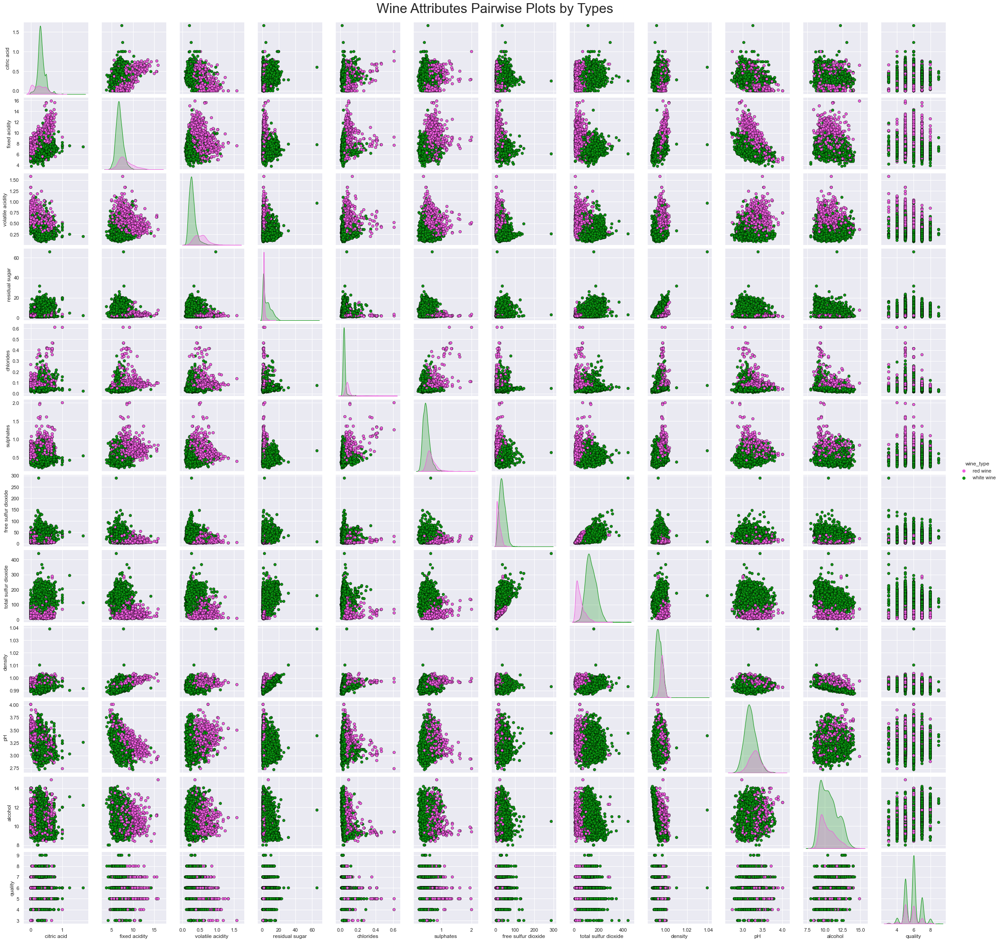

In [13]:
#create a pairplot to look at the correlation between the variables in terms of wine types in the dataset
winetype_pairplot = sns.pairplot(data = df, 
                             hue='wine_type', 
                             palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
                             plot_kws=dict(edgecolor='black', linewidth=0.5)
                                 ) 
plt.subplots_adjust(top=0.96, wspace=0.2)
plt.suptitle('Wine Attributes Pairwise Plots by Types', fontsize=30)

From the pairplot above, we can notice a few things about the two types of wines:
- Red wine has higher fixed acidity, volatile acidity and chlorides in general.
- White wine has higher free sulfur dioxide, total sulphur dioxide and residual sugar.
- alcohol and density have a slight negative correlation in that a higher alcohol quantity will mean a lower density. There are a few outliers to this.
- fixed acidity and density has a slight positive correlation showing that an increase in fixed acidity will lead to a small increase in density.
- residual sugar also has a positive correlation with density and so an increase in this attribute will lead to an increase in density.

On an individual level, let's look at the quality distribution of wine by type. We can plot two count plots: the first one will show the count of red and white wine samples by quality and the second will show the count of red and white samples based on the quality label.

Text(0, 0.5, 'Count')

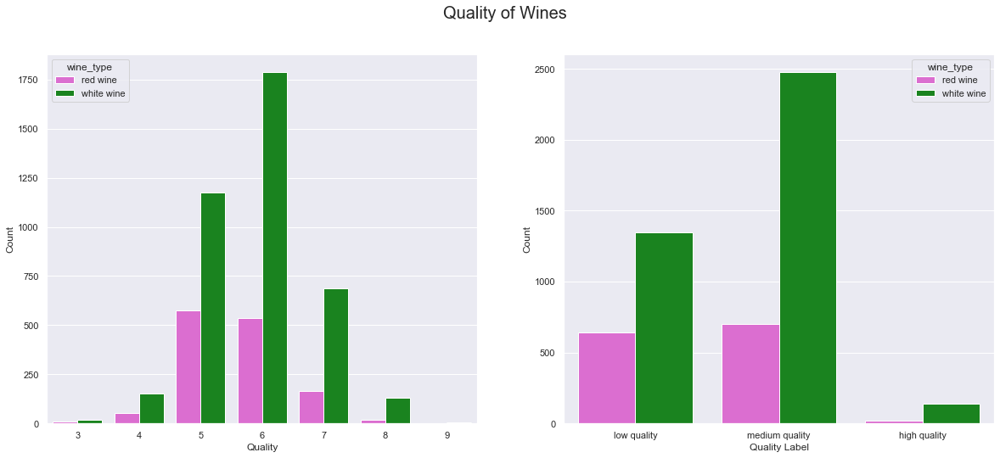

In [14]:
#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the relationship between quality and wine by type
sns.countplot(x = 'quality', 
              hue = 'wine_type',
              palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
              data = df, 
              ax = ax1
             )
ax1.set_xlabel("Quality")
ax1.set_ylabel("Count")

#Plotting the relationship between quality_label and wine by type
sns.countplot(x = 'quality_label', 
              hue = 'wine_type',
              palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
              data = df , 
              order = ['low quality', 'medium quality', 'high quality'], 
              ax = ax2
             )
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("Count")


From this we can see that:
- both the wine types have a higher number of medium or average quality wines.
- both the wines also have a relatively low number of high quality wines.
- the difference is however, white wines have significantly bigger difference between the number of low quality and medium quality wines. The red wines have a much smaller difference between the number of low quality and medium quality wines.  

We can also look at the quality attribute in relation to alcohol content by plotting a boxplot using `sns.boxplot()`

Text(0, 0.5, 'Alcohol (vol.%)')

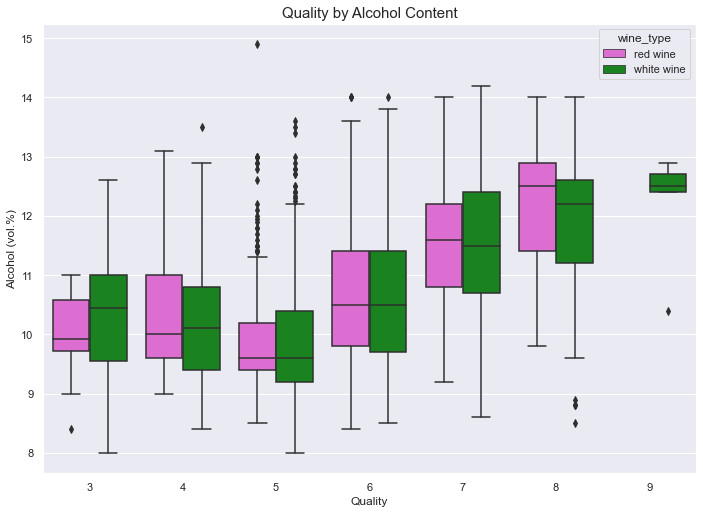

In [15]:
#plot a box plot to show the relationship to alcohol content.
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.boxplot(data = df, 
            x = 'quality', 
            y = 'alcohol', 
            hue = 'wine_type', 
            palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}
           )
plt.title("Quality by Alcohol Content", fontsize= 15)
plt.xlabel("Quality")
plt.ylabel("Alcohol (vol.%)")


This boxplot looks like it will be helpful for further analysis in my research question 1 and since I will most likely use it in a subplot I can wrap this in a function and save it in the **project_functions.py** file to call it later.

In [16]:
#this is the wrapped function that will go onto the project_functions.py file 
def boxplot1(a, b, x, y , z):
    boxplot = sns.boxplot(ax = a, 
                data = b, 
            x = x, 
            y = y, 
            hue = z, 
            palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}
           )
    return boxplot

---

### RESEARCH QUESTION 1
#### Do the best wines have a high alcohol content or a high fixed acidity, or both?
##### **ANALYSIS**

For this question we will use three kinds of plots to answer three individual sections of the analysis. A regression plot to find the correlation between alcohol and fixed acidity. This plot is simply a scatter plot with a regression line plotted on top of it; the slope of the regression line allows us to make a decision on the nature of correlation between the two variables. A box plot and violin plot to determine the quality of wine samples by type based of the attributes alcohol and fixed acidity respectively. These graphs show the distribution of the data and will be helpful because we can look at the distribution of the data and infer values like the median, interquartile range, the highest value and the lowest value recorded. From this we will be able to draw conclusions on the relationship between quality and the two variables: alcohol content and fixed acidity. 


Based on this information we can conduct our analysis. Let us first take a look at the correlation between  alcohol and fixed acidity.


Text(0, 0.5, 'Fixed Acidity (g(tartaric acid)/$dm^3$)')

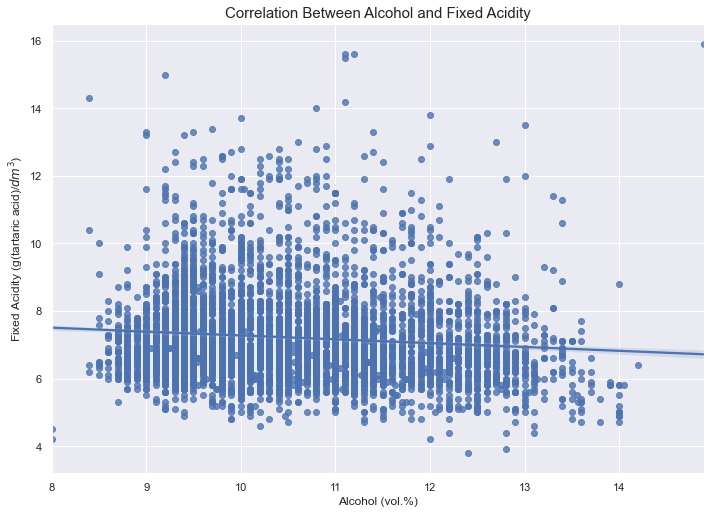

In [17]:
#using regplot() to find a correlation
sns.regplot(data = df, x = 'alcohol', y = 'fixed acidity')
plt.title("Correlation Between Alcohol and Fixed Acidity", fontsize= 15)
plt.xlabel("Alcohol (vol.%)")
plt.ylabel("Fixed Acidity (g(tartaric acid)/$dm^3$)")

To be more exact we can calculate the pairwise correlation between the the two attributes.

In [18]:
correlation = df['fixed acidity'].corr(df['alcohol'])
round(correlation , 4)

-0.1026

    A negative correlation as shown above means that the the two variables are moving in the opposite direction; an increase in alcohol levels will lead to a reduction in fixed acidity. It is important to note that the value -0.1026 is representative of an extremely week correlation - this is backed up by the almost flat regression line in the plot. So a change in alcohol would cause a very small change in fixed acidity. 

Lets look at the quality of each wine by alcohol content. We can use the boxplot in our EDA to look at this.

In [19]:
#Using relative import to call the boxplot.
sys.path.insert(0, os.path.abspath('..'))
from scripts.project_functions import boxplot1

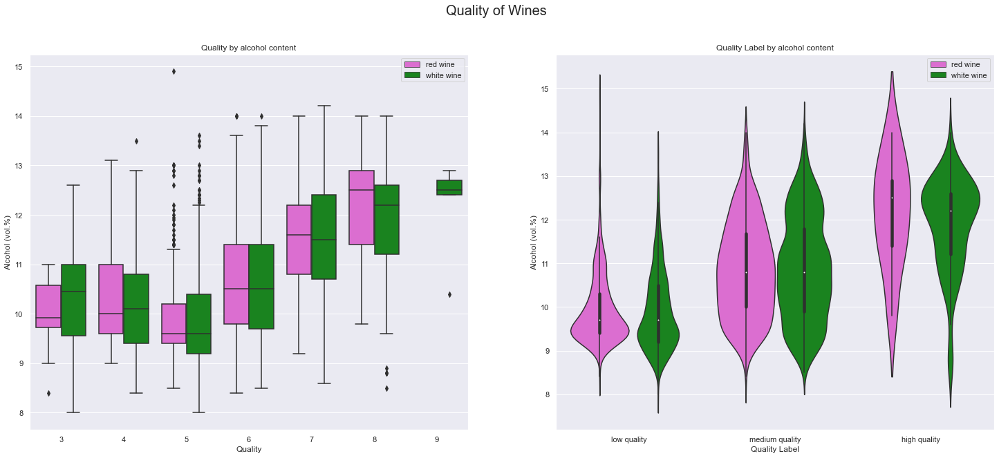

In [20]:
#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the box plot of alcohol by quality by using the function from project_functions.py
boxplot1(ax1, df, 'quality', 'alcohol', 'wine_type')
ax1.set_title("Quality by alcohol content")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Alcohol (vol.%)")
ax1.legend(loc = 'best')


#Plotting the violin plot of alcohol by quality label
sns.violinplot(ax = ax2, 
               data = df, 
               x = 'quality_label', 
               y = 'alcohol', 
               hue = 'wine_type', 
               palette={'red wine': '#ED5CDE', 'white wine': '#09940F'}, 
               order = ['low quality', 'medium quality', 'high quality']
              )
ax2.set_title("Quality Label by alcohol content")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("Alcohol (vol.%)")
ax2.legend(loc = 'best')

From this box plot the following can be inferred:
- Generally speaking, the higher the alcohol content the higher the quality of the wine.
- Only white wine has the highest quality  of 9.
- Both wines with quality 5 and 6 have the same median value. 
- Both wines with quality 5 have more outliers than the rest of the quality values.

From the violin plot:
- Low quality wines are showing a distribution that is skewed to the left which means that majority of the wines in this range have a low alcohol content.
- medium quality wines have a normal distribution meaning the values are more evenly spread in terms of alcohol content.
- high quality wines are showing a distribution that is skewed to the right which means that majority of the wines in this range have a higher alcohol content.

Lets look at this from the perspective of fixed acidity; what would the quality of wines be based on fixed acidity. Using the function boxplot1  we can plot a similar boxplot to the one above.

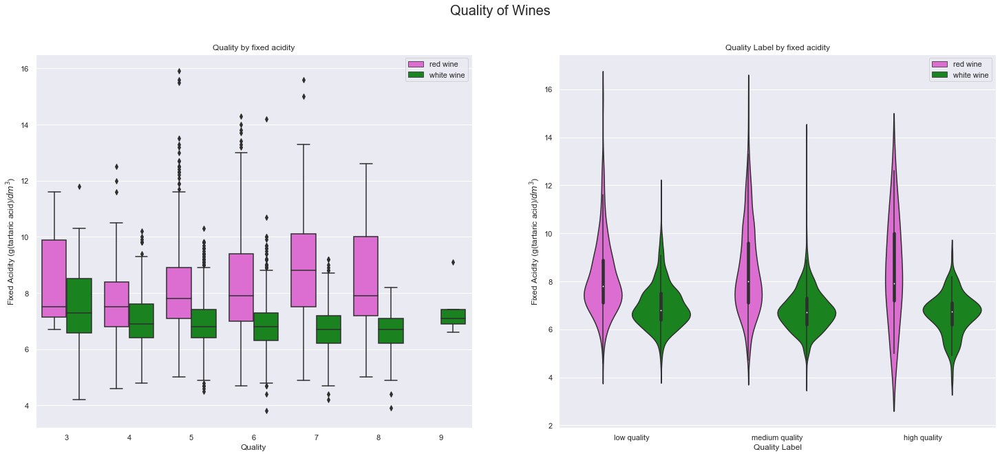

In [21]:
#Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines', fontsize=20)

#Plotting the box plot of fixed acidity by quality by using the function from project_functions.py
boxplot1(ax1, df, 'quality', 'fixed acidity', 'wine_type')
ax1.set_title("Quality by fixed acidity")
ax1.set_xlabel("Quality")
ax1.set_ylabel("Fixed Acidity (g(tartaric acid)/$dm^3$)")
ax1.legend(loc = 'best')


#Plotting the violin plot of fixed acidity by quality label
sns.violinplot(ax = ax2, 
               data = df, 
               x = 'quality_label', 
               y = 'fixed acidity', 
               hue = 'wine_type', 
               palette={'red wine': '#ED5CDE', 'white wine': '#09940F'},
               order = ['low quality', 'medium quality', 'high quality']
              )
ax2.set_title("Quality Label by fixed acidity")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("Fixed Acidity (g(tartaric acid)/$dm^3$)")
ax2.legend(loc = 'best')

From this box plot the following can be inferred:
- At first glance all the boxplots are located in similar ranges and we cant immediately conclude that a different fixed acidities lead to changes in quality.
- Only white wine has the highest quality  of 9 but this has nothing to do with fixed acidity.
- The medians of all red wine samples by quality are all close to each other. This is the same case with the white wines.
From the violin plot:
- all the plots for both wines have normal distributions with the same medians. 

##### **CONCLUSIONS**
   - The best wines tend to be of a higher quality.
   - When we looked at the correlation between alcohol and fixed acidity at the beginning we could see that there is a negative correlation between the two. This made me tentatively think that if one of the variables had a bigger effect on quality, the other would not.
   - Looking at the box and violin plot for the relationship between alcohol content and quality it could be seen that the lower the alcohol content the lower the quality of wines.
   - Looking at the box and violin plot for the relationship between fixed acidity content and quality we can see that because of the relatively similar values accross each quality label.
   - Therefore, we can conclude that the best quality wines have a high alcohol content and fixed acidity has little to no effect on the quality of wines.
   
---

### RESEARCH QUESTION 2
#### Does the amount of residual sugar in white wines lead to a higher density for those wines? 
##### **ANALYSIS**
Since this question is looking at the effect that one variable (residual sugar) has on another variable (density), we should attempt to find the correlation between the two variables. This is why we will need only a regression plot to answer this question. After plotting the data, it may be possible to calculate a correlation coefficient to draw a better conclusion.

For this question it would be best to edit the dataframe more for better analysis first. We can drop all red wine data and the columns that will not be necessary for the analysis.

In [22]:
dfa = (df
       #drop the columns that we will not be using in this analysis
       .drop(columns = ['citric acid', 'fixed acidity', 'volatile acidity', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide','pH', 'alcohol', 'quality', 'quality_label'])
       #drop all the red wine rows.
       .loc[lambda row : ~row['wine_type'].str.contains('red wine')]
       .drop(columns = ['wine_type'])
      )
       
dfa

,residual sugar,sulphates,density
1,2.0,0.53,0.99273
2,3.1,0.33,0.98913
3,1.8,0.43,0.99251
4,1.1,0.28,0.99050
5,6.8,0.42,0.99280
...,...,...,...
6487,1.3,0.39,0.99398
6489,1.0,0.61,0.99289
6490,1.3,0.45,0.99352
6493,1.1,0.55,0.99366


Now that we have wrangled our data to create a dataframe that includes only the data needed for this question, lets take a look at the correlation between the two variables.

Text(0, 0.5, 'Density (g/$dm^3$)')

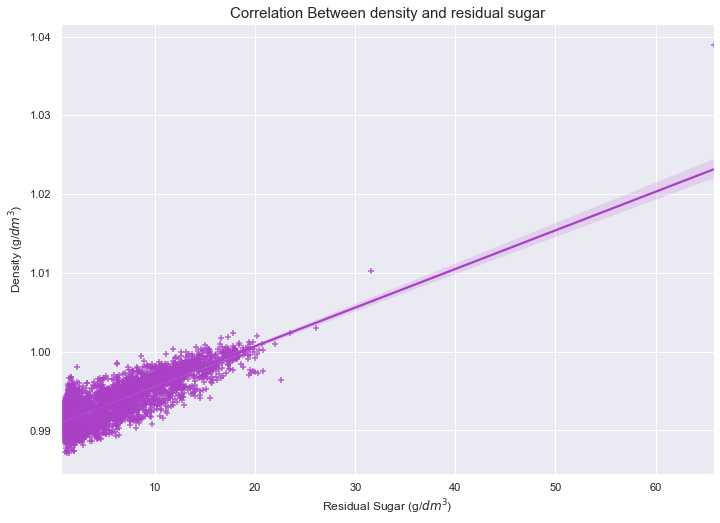

In [35]:
#using regplot() to find a correlation
sns.regplot(data = dfa, 
            x = 'residual sugar', 
            y = 'density', 
            marker= "+", 
            color = '#A940C6'
           )
plt.title("Correlation Between density and residual sugar", fontsize = 15)
plt.xlabel("Residual Sugar (g/$dm^3$)")
plt.ylabel("Density (g/$dm^3$)")

Again to be more exact we can calculate the pairwise correlation between the the two attributes.

In [24]:
correlation2 = dfa['residual sugar'].corr(dfa['density'])
round(correlation2 , 4)

0.8205

##### **CONCLUSIONS**
- Immediately from the plot we can see a positive trend between the residual sugar and density which allows us to conclude that an increase  in the residual sugar will lead to an increase in the density of the wine.
- If we were to look at this based on the correlation coefficient, a perfect positive correlation would be 1. In this case 0.8205 is close to 1 so there is a strong correlation so an increase in residual sugar will lead to a significant increase density of the wines

---

### RESEARCH QUESTION 3
#### Does acidity, based on the fixed acidity and pH, have an effect on the quality of the wine samples?
##### **ANALYSIS**
For this question we will be taking a look at the relationship between that two variables (fixed acidity and pH) have on the quality of the wines. So we would first try to establish whether there is a correlation between fixed acidity and pH. We can do this by plotting a regression plot and calculating the correlation coefficient of the slope. After that we can plot bar graphs so that we can find the relationship between each of these variables and the attributes quality and quality_label. 

First, we should look at the correlation between fixed acidity and pH more closely.

Text(0, 0.5, 'pH')

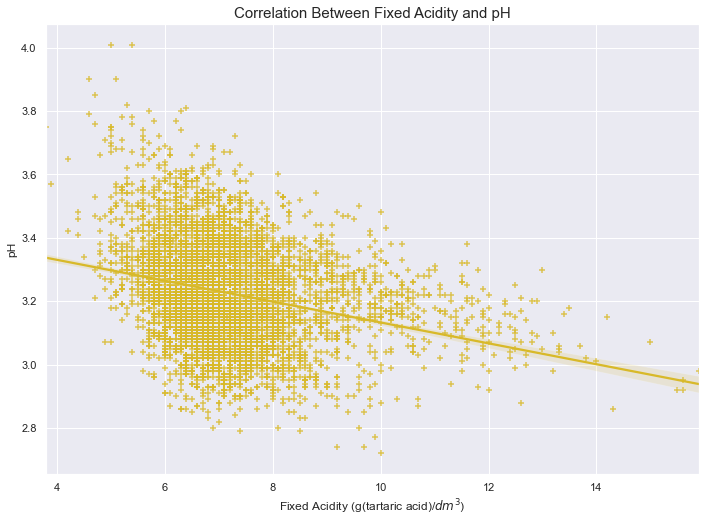

In [36]:
#using regplot() to find a correlation
sns.regplot(data = df, 
            x = 'fixed acidity', 
            y = 'pH', 
            marker= "+", 
            color = '#D8B929'
           )
plt.title("Correlation Between Fixed Acidity and pH", fontsize = 15)
plt.xlabel("Fixed Acidity (g(tartaric acid)/$dm^3$)")
plt.ylabel("pH")

And again, like in the previous questions we should find an exact value for the correlation coefficient since it will help us in our analysis.

In [26]:
correlation3 = df['fixed acidity'].corr(df['pH'])
round(correlation3 , 4)

-0.2712

    A negative correlation means that these variables are "moving in the opposite direction"; an increase in fixed acidity will lead to a fall in the pH level.

Then, we should first wrangle the dataframe to make a new dataframe that will suit this analysis better. Since we want only red wine data we can drop all the white wine data and drop all columns that would not be necessary. We can also combine the fixed acidity and pH columns into a singular column called attributes so that we can plot the data together in the bar plot.

In [27]:
dfb = (df
       #drop the columns that we will not be using in this analysis
       .drop(columns = ['citric acid', 'residual sugar', 'density', 'volatile acidity', 'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'alcohol'])
       #drop all the red wine rows.
       .loc[lambda row : ~row['wine_type'].str.contains('white wine')]
       #drop wine_type because it is now redundant.
       .drop(columns = ['wine_type'])
       #create a longer dataframe so that there is a singular column 'Attributes'
       .melt(id_vars=['quality', 'quality_label'] , 
                              value_vars=['fixed acidity', 'pH'], 
                              var_name='attributes', 
                              value_name='values')
      )
       
dfb

,quality,quality_label,attributes,values
0,6,medium quality,fixed acidity,6.80
1,5,low quality,fixed acidity,9.50
2,5,low quality,fixed acidity,7.30
3,7,medium quality,fixed acidity,8.20
4,4,low quality,fixed acidity,6.40
...,...,...,...,...
2713,6,medium quality,pH,3.43
2714,5,low quality,pH,3.52
2715,6,medium quality,pH,3.00
2716,5,low quality,pH,3.36


Using the wrangled dataframe we can now plot the bar plots to show the relationship between attributes and quality.

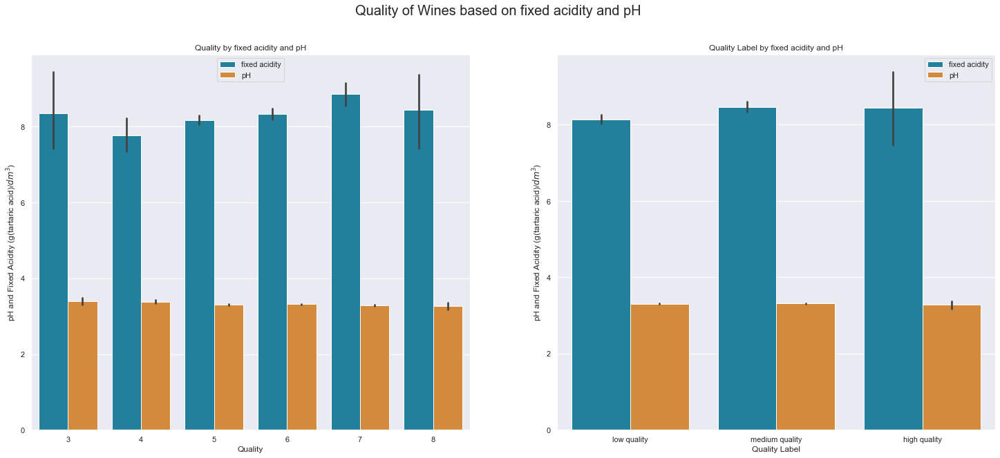

In [37]:
# Set title and figure sizes
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))
f.suptitle('Quality of Wines based on fixed acidity and pH', fontsize=20)

#Plotting the bar plot of fixed acidity and pH by quality
sns.barplot(ax = ax1, 
            data= dfb , 
            x = 'quality', 
            y = 'values', 
            hue = 'attributes', 
            palette={'fixed acidity': '#0F8BB0', 'pH': '#EC8B24'}
           )
ax1.set_title("Quality by fixed acidity and pH")
ax1.set_xlabel("Quality")
ax1.set_ylabel("pH and Fixed Acidity (g(tartaric acid)/$dm^3$)")
ax1.legend(loc = 'best')


#Plotting the bar plot of fixed acidity and pH by quality label
sns.barplot(ax = ax2, 
            data= dfb, 
            x = 'quality_label', 
            y = 'values', 
            hue = 'attributes', 
            palette={'fixed acidity': '#0F8BB0', 'pH': '#EC8B24'}, 
            order = ['low quality', 'medium quality', 'high quality']
           )
ax2.set_title("Quality Label by fixed acidity and pH")
ax2.set_xlabel("Quality Label")
ax2.set_ylabel("pH and Fixed Acidity (g(tartaric acid)/$dm^3$)")
ax2.legend(loc = 'best')

##### **CONCLUSIONS**
- pH is the scale that looks at how acidic or basic the red wines are. Since fixed acidity is also a measure of how acidic the wine is, the expectation is there would be a correlation between the two variables.
- The regression plot shows a negative correlation showing that an increase in fixed acidity will lead to a lower pH, which makes sense because on the pH scale a substance is acidic has a value less than 7 and the more acidic the substance is the lower this number gets.
- To understand the relationship between these variables and quality, I used the data in the new dataframe to create two bar plots that compare them to quality and quality_label respectively.
- We can see on these bar plots that the values of both fixed acidity and and pH remain fairly the same regardless of the quality of wine.
- From this we can conclude that acidity based on fixed acidity and pH has little to no effect on the quality of the wine.
---